In [6]:
%pip install pandas


  Using cached pandas-2.0.0-cp310-cp310-win_amd64.whl (11.2 MB)
  Using cached tzdata-2023.3-py2.py3-none-any.whl (341 kB)
  Using cached numpy-1.24.3-cp310-cp310-win_amd64.whl (14.8 MB)
  Using cached pytz-2023.3-py2.py3-none-any.whl (502 kB)


You should consider upgrading via the 'c:\data\innopolis\innopolis_labs\lr7\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [8]:
%pip install scikit-learn

     ---------------------------------------- 8.3/8.3 MB 5.5 MB/s eta 0:00:00
     -------------------------------------- 298.0/298.0 KB 6.1 MB/s eta 0:00:00
     ---------------------------------------- 42.5/42.5 MB 6.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\data\innopolis\innopolis_labs\lr7\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [2]:
%pip install matplotlib

  Using cached matplotlib-3.7.1-cp310-cp310-win_amd64.whl (7.6 MB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)
  Using cached fonttools-4.39.3-py3-none-any.whl (1.0 MB)
  Using cached Pillow-9.5.0-cp310-cp310-win_amd64.whl (2.5 MB)
  Using cached contourpy-1.0.7-cp310-cp310-win_amd64.whl (162 kB)
  Using cached pyparsing-3.0.9-py3-none-any.whl (98 kB)
  Using cached kiwisolver-1.4.4-cp310-cp310-win_amd64.whl (55 kB)
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\data\innopolis\innopolis_labs\lr7\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [14]:
%pip install numpy

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\data\innopolis\innopolis_labs\lr7\venv\Scripts\python.exe -m pip install --upgrade pip' command.


# Используйте классификатор SVM для diabetes.csv

# SVM с линейным ядром

In [28]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Загрузка данных
data = pd.read_csv("diabetes.csv")

# Разделение данных на признаки и целевую переменную
X = data.drop("Outcome", axis=1)
y = data["Outcome"]

# Разделение данных на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Масштабирование данных
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Обучение модели SVM с линейным ядром
linear_svm = SVC(kernel='linear')
linear_svm.fit(X_train, y_train)

# Предсказание на тестовой выборке
y_pred = linear_svm.predict(X_test)

# Вычисление score (точности) модели
accuracy = accuracy_score(y_test, y_pred)
print(f"Score модели для линейного ядра: {accuracy:.4f}")

Score модели для линейного ядра: 0.7597


In [29]:
# Определение наиболее важных признаков с использованием решающего дерева
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)
importances = tree.feature_importances_
top_features = np.argsort(importances)[-3:]
print(f"Топ 3 признака: {list(X.columns[top_features])}")

Топ 3 признака: ['BloodPressure', 'BMI', 'Glucose']


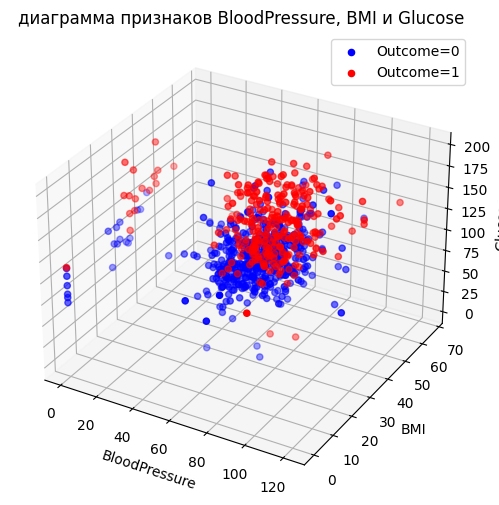

In [34]:
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(121, projection='3d')
ax.scatter(X[y == 0][X.columns[top_features[0]]], X[y == 0][X.columns[top_features[1]]], X[y == 0][X.columns[top_features[2]]], color='blue', label='Outcome=0')
ax.scatter(X[y == 1][X.columns[top_features[0]]], X[y == 1][X.columns[top_features[1]]], X[y == 1][X.columns[top_features[2]]], color='red', label='Outcome=1')
ax.set_xlabel(X.columns[top_features[0]])
ax.set_ylabel(X.columns[top_features[1]])
ax.set_zlabel(X.columns[top_features[2]])
ax.legend()
ax.set_title(f'диаграмма признаков {X.columns[top_features[0]]}, {X.columns[top_features[1]]} и {X.columns[top_features[2]]}')

plt.show()


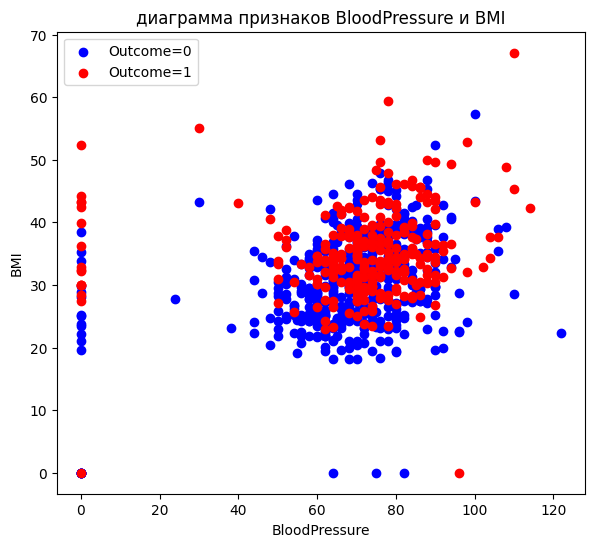

In [35]:
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(122)
ax.scatter(X[y == 0][X.columns[top_features[0]]], X[y == 0][X.columns[top_features[1]]], color='blue', label='Outcome=0')
ax.scatter(X[y == 1][X.columns[top_features[0]]], X[y == 1][X.columns[top_features[1]]], color='red', label='Outcome=1')
ax.set_xlabel(X.columns[top_features[0]])
ax.set_ylabel(X.columns[top_features[1]])
ax.legend()
ax.set_title(f'диаграмма признаков {X.columns[top_features[0]]} и {X.columns[top_features[1]]}')

plt.show()


# SVM с полиномиальным ядром

In [36]:
# Обучение модели SVM с полиномиальным ядром
poly_svm = SVC(kernel='poly', degree=3)
poly_svm.fit(X_train, y_train)

# Предсказание на тестовой выборке
y_pred = poly_svm.predict(X_test)

# Вычисление score (точности) модели
accuracy = accuracy_score(y_test, y_pred)
print(f"Score модели для полиномиального ядра: {accuracy:.4f}")

Score модели для полиномиального ядра: 0.7468


In [37]:
# Определение наиболее важных признаков с использованием решающего дерева
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)
importances = tree.feature_importances_
top_features = np.argsort(importances)[-3:]
print(f"Топ 3 признака: {list(X.columns[top_features])}")

Топ 3 признака: ['BMI', 'BloodPressure', 'Glucose']


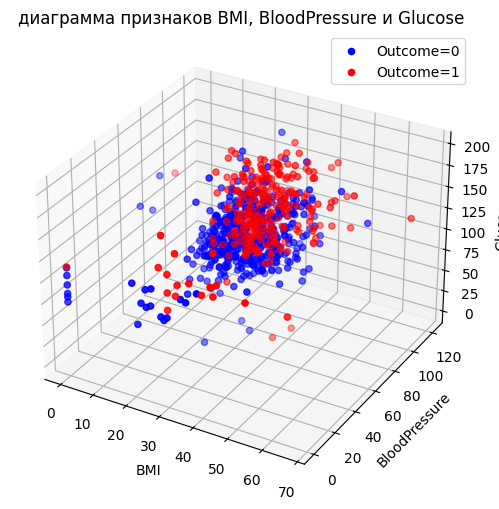

In [44]:
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(121, projection='3d')
ax.scatter(X[y == 0][X.columns[top_features[0]]], X[y == 0][X.columns[top_features[1]]], X[y == 0][X.columns[top_features[2]]], color='blue', label='Outcome=0')
ax.scatter(X[y == 1][X.columns[top_features[0]]], X[y == 1][X.columns[top_features[1]]], X[y == 1][X.columns[top_features[2]]], color='red', label='Outcome=1')
ax.set_xlabel(X.columns[top_features[0]])
ax.set_ylabel(X.columns[top_features[1]])
ax.set_zlabel(X.columns[top_features[2]])
ax.legend()
ax.set_title(f'диаграмма признаков {X.columns[top_features[0]]}, {X.columns[top_features[1]]} и {X.columns[top_features[2]]}')

plt.show()

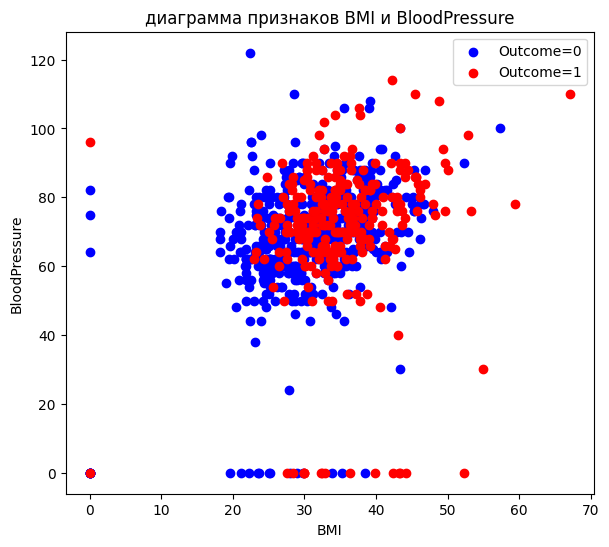

In [45]:
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(122)
ax.scatter(X[y == 0][X.columns[top_features[0]]], X[y == 0][X.columns[top_features[1]]], color='blue', label='Outcome=0')
ax.scatter(X[y == 1][X.columns[top_features[0]]], X[y == 1][X.columns[top_features[1]]], color='red', label='Outcome=1')
ax.set_xlabel(X.columns[top_features[0]])
ax.set_ylabel(X.columns[top_features[1]])
ax.legend()
ax.set_title(f'диаграмма признаков {X.columns[top_features[0]]} и {X.columns[top_features[1]]}')

plt.show()


# SVM с Гауссовым ядром

In [46]:
# Обучение модели SVM с Гауссовым ядром
rbf_svm = SVC(kernel='rbf')
rbf_svm.fit(X_train, y_train)

# Предсказание на тестовой выборке
y_pred_rbf = rbf_svm.predict(X_test)

# Вычисление score (точности) модели
accuracy_rbf = accuracy_score(y_test, y_pred_rbf)
print(f"Score модели для Гауссова ядра: {accuracy_rbf:.4f}")

Score модели для Гауссова ядра: 0.7338


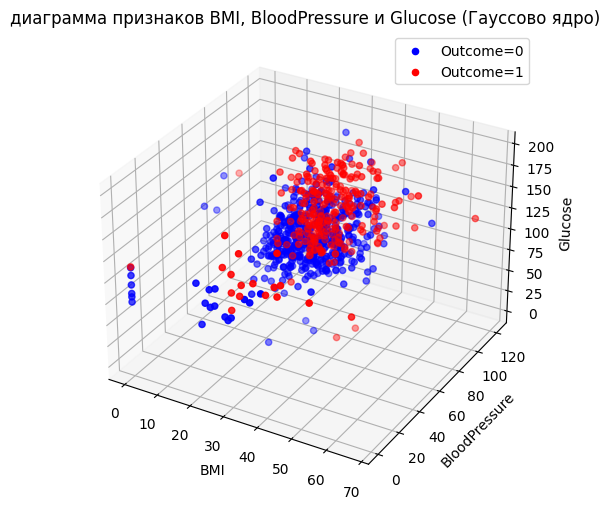

In [47]:
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(121, projection='3d')
ax.scatter(X[y == 0][X.columns[top_features[0]]], X[y == 0][X.columns[top_features[1]]], X[y == 0][X.columns[top_features[2]]], color='blue', label='Outcome=0')
ax.scatter(X[y == 1][X.columns[top_features[0]]], X[y == 1][X.columns[top_features[1]]], X[y == 1][X.columns[top_features[2]]], color='red', label='Outcome=1')
ax.set_xlabel(X.columns[top_features[0]])
ax.set_ylabel(X.columns[top_features[1]])
ax.set_zlabel(X.columns[top_features[2]])
ax.legend()
ax.set_title(f'диаграмма признаков {X.columns[top_features[0]]}, {X.columns[top_features[1]]} и {X.columns[top_features[2]]} (Гауссово ядро)')

plt.show()

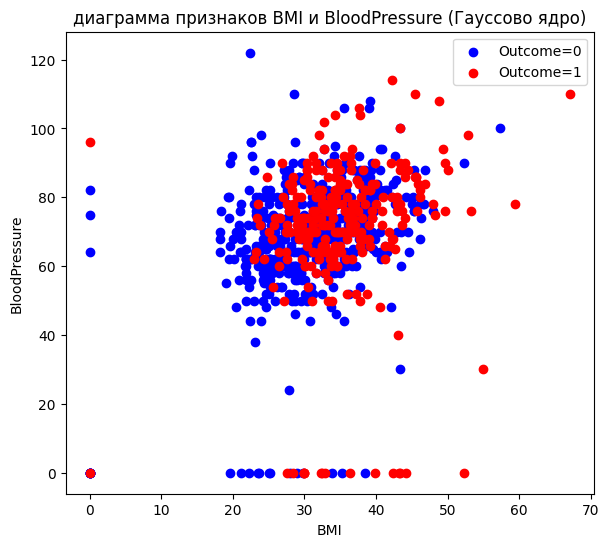

In [48]:
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(122)
ax.scatter(X[y == 0][X.columns[top_features[0]]], X[y == 0][X.columns[top_features[1]]], color='blue', label='Outcome=0')
ax.scatter(X[y == 1][X.columns[top_features[0]]], X[y == 1][X.columns[top_features[1]]], color='red', label='Outcome=1')
ax.set_xlabel(X.columns[top_features[0]])
ax.set_ylabel(X.columns[top_features[1]])
ax.legend()
ax.set_title(f'диаграмма признаков {X.columns[top_features[0]]} и {X.columns[top_features[1]]} (Гауссово ядро)')

plt.show()

# SVM с сигмоидным ядром

In [49]:
# Обучение модели SVM с сигмоидным ядром
sigmoid_svm = SVC(kernel='sigmoid')
sigmoid_svm.fit(X_train, y_train)

# Предсказание на тестовой выборке
y_pred_sigmoid = sigmoid_svm.predict(X_test)

# Вычисление score (точности) модели
accuracy_sigmoid = accuracy_score(y_test, y_pred_sigmoid)
print(f"Score модели для сигмоидного ядра: {accuracy_sigmoid:.4f}")

Score модели для сигмоидного ядра: 0.6429


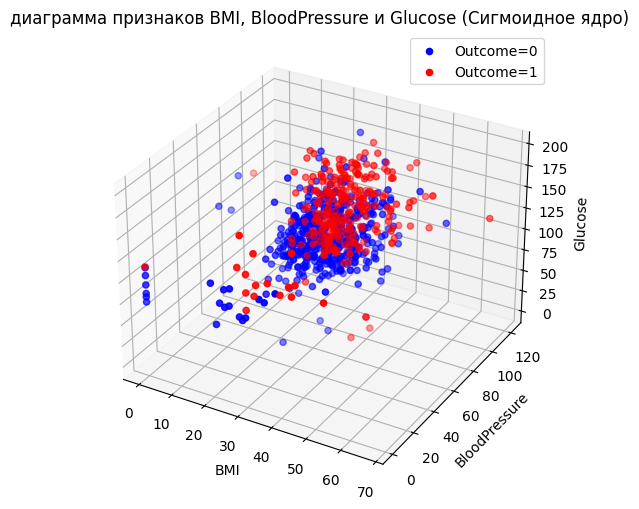

In [50]:
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(121, projection='3d')
ax.scatter(X[y == 0][X.columns[top_features[0]]], X[y == 0][X.columns[top_features[1]]], X[y == 0][X.columns[top_features[2]]], color='blue', label='Outcome=0')
ax.scatter(X[y == 1][X.columns[top_features[0]]], X[y == 1][X.columns[top_features[1]]], X[y == 1][X.columns[top_features[2]]], color='red', label='Outcome=1')
ax.set_xlabel(X.columns[top_features[0]])
ax.set_ylabel(X.columns[top_features[1]])
ax.set_zlabel(X.columns[top_features[2]])
ax.legend()
ax.set_title(f'диаграмма признаков {X.columns[top_features[0]]}, {X.columns[top_features[1]]} и {X.columns[top_features[2]]} (Сигмоидное ядро)')

plt.show()


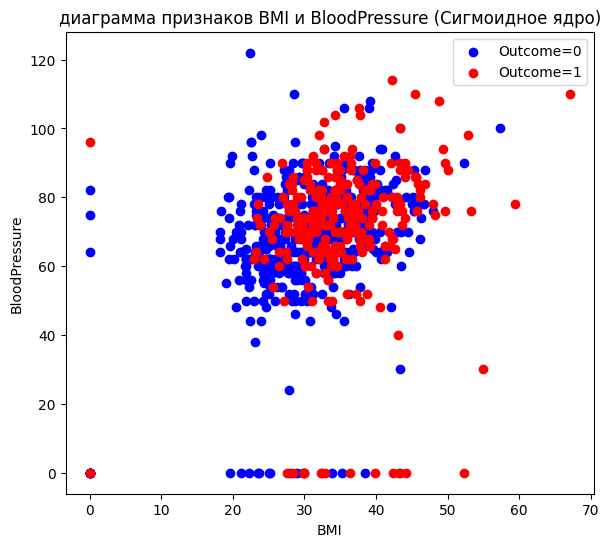

In [51]:
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(122)
ax.scatter(X[y == 0][X.columns[top_features[0]]], X[y == 0][X.columns[top_features[1]]], color='blue', label='Outcome=0')
ax.scatter(X[y == 1][X.columns[top_features[0]]], X[y == 1][X.columns[top_features[1]]], color='red', label='Outcome=1')
ax.set_xlabel(X.columns[top_features[0]])
ax.set_ylabel(X.columns[top_features[1]])
ax.legend()
ax.set_title(f'диаграмма признаков {X.columns[top_features[0]]} и {X.columns[top_features[1]]} (Сигмоидное ядро)')

plt.show()

# https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

# Используйте классификатор Дерева Решения для diabetes.csv Постройте визуальную интерпретацию получившегося дерева, используя критерий gini

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split

# Загрузка данных
data = pd.read_csv("diabetes.csv")

# Разделение данных на признаки и целевую переменную
X = data.drop("Outcome", axis=1)
y = data["Outcome"]

# Разделение данных на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Обучение дерева решений с критерием Gini
tree_gini = DecisionTreeClassifier(criterion='gini', random_state=42)
tree_gini.fit(X_train, y_train)

# Вычисление score модели
score = tree_gini.score(X_test, y_test)
print(f"Score модели дерева решений с критерием Gini: {score:.4f}")

Score модели дерева решений с критерием Gini: 0.7468


In [7]:
# дерево решений
fig, ax = plt.subplots(figsize=(120, 90))
plot_tree(tree_gini, filled=True, ax=ax, feature_names=X.columns, class_names=['0', '1'], rounded=True, fontsize=10, proportion=False)
plt.subplots_adjust(left=0.01, right=0.99, top=0.99, bottom=0.01)
plt.show()

# Используйте классификатор Дерева Решения для diabetes.csv Постройте визуальную интерпретацию получившегося дерева, используя критерий entropy

In [10]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score

# Обучение классификатора дерева решений с критерием 'entropy'
tree_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)
tree_entropy.fit(X_train, y_train)

# Вычисление score (точности) модели
y_pred_entropy = tree_entropy.predict(X_test)
accuracy_entropy = accuracy_score(y_test, y_pred_entropy)
print(f"Score модели с критерием 'entropy': {accuracy_entropy:.4f}")

Score модели с критерием 'entropy': 0.7208


In [12]:
# дерево решений
fig, ax = plt.subplots(figsize=(120, 90))
plot_tree(tree_entropy, filled=True, ax=ax, feature_names=X.columns, class_names=['0', '1'], rounded=True, fontsize=10, proportion=False)
plt.subplots_adjust(left=0.01, right=0.99, top=0.99, bottom=0.01)
plt.show()

# Используйте классификатор Дерева Решения для diabetes.csv Постройте визуальную интерпретацию получившегося дерева, используя критерий log_loss

In [23]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score

# Обучение классификатора дерева решений с критерием 'log_loss'
tree_log_loss = DecisionTreeClassifier(criterion='log_loss', random_state=42)
tree_log_loss.fit(X_train, y_train)

# Вычисление score (точности) модели
y_pred_log_loss = tree_log_loss.predict(X_test)
accuracy_log_loss = accuracy_score(y_test, y_pred_log_loss)
print(f"Score модели с критерием 'log_loss': {accuracy_log_loss:.4f}")

Score модели с критерием 'log_loss': 0.7208


In [24]:
# дерево решений
fig, ax = plt.subplots(figsize=(120, 90))
plot_tree(tree_log_loss, filled=True, ax=ax, feature_names=X.columns, class_names=['0', '1'], rounded=True, fontsize=10, proportion=False)
plt.subplots_adjust(left=0.01, right=0.99, top=0.99, bottom=0.01)
plt.show()